# Identifying Solar Panel Arrays from Satellite Imagery
 

<img src= "panels2.png", width=700, height=400, align='left'>

<a id='Top'></a>
# Introduction

## Problem Statement

Over the last decade, U.S. residential and commercial solar panel installations have grown dramatically. This is in large part due to the growing concerns regarding climate change, but also because of lower costs. Solar installation costs have fallen over 70% in the last 10 years and continue to improve. 

The full extent of this growth, however, is not well understood as the data for residential and commercial solar installations is typically reported only at the level of the state. Having a more granular dataset would benefit a wide variety of parties, including utilities, policy makers, and solar developers. Utilities, in particular, will face many challenges safely integrating such a high amount of distributed generation and therefore will benefit greatly from understanding the magnitude and distribution of these resources. 

For this project, high resolution satellite imagery and machine learning techniques will be used to identify where solar panels are installed. 

## Description of Data

This analysis will leverage a dataset created by members of the Energy Data Analytics Lab at Duke University. The dataset contains geospatial data and border vertices for over 19,000 solar panels, located in the California cities of Fresno, Stockton, Oxnard, and Modesto. The satellite images are part of the USGS collection of High Resolution Orthoimagery (HRO). The majority of the raw images are 5000x5000 pixels, at a resolution of 0.3m/pixel. 

Link to Dataset:
https://figshare.com/collections/Full_Collection_Distributed_Solar_Photovoltaic_Array_Location_and_Extent_Data_Set_for_Remote_Sensing_Object_Identification/3255643/1

# Table of Contents
- <a href='#Section 1'>Section 1: Data Munging</a>
- <a href='#Section 2'>Section 2: Exploratory Data Analysis</a>
- <a href='#Section 3'>Section 3: Image Segmentation</a>
- <a href='#Section 4'>Section 4: Segment Feature Extraction</a>
- <a href='#Section 5'>Section 5: Create Training/Testing Data</a>
- <a href='#Section 6'>Section 6: Classification</a>
- <a href='#Section 7'>Section 7: Conclusion and Next Steps</a>

### Import Modules

In [2]:
import pandas as pd
import numpy as np

from scipy.stats import describe

from skimage.segmentation import quickshift, mark_boundaries 
from skimage.draw import polygon, polygon_perimeter
from skimage import measure
from skimage import io

from matplotlib.patches import Circle, Polygon
import matplotlib.pyplot as plt
import matplotlib.cm as cm

from ipywidgets import interact, fixed
from os import listdir

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

### Import Raw Data

In [3]:
raw_data_1 = ('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/Duke Array Location and Extent Data Set/polygonDataExceptVertices.csv')
raw_data_2 = ('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/Duke Array Location and Extent Data Set/polygonVertices_PixelCoordinates.csv')

arrays = pd.read_csv(raw_data_1)
vertices_pix = pd.read_csv(raw_data_2)

In [83]:
arrays.head()

,polygon_id,centroid_latitude,centroid_longitude,centroid_latitude_pixels,centroid_longitude_pixels,city,area_pixels,area_meters,image_name,nw_corner_of_image_latitude,nw_corner_of_image_longitude,se_corner_of_image_latitude,se_corner_of_image_longitude,datum,projection_zone,resolution,jaccard_index
0,1,36.926055,-119.840241,107.618458,3286.151487,Fresno,136.192872,1513.254134,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.914020
1,2,36.926217,-119.840241,45.977659,3286.352946,Fresno,155.511714,1727.907934,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.829071
2,3,36.926277,-119.840174,22.280851,3303.465657,Fresno,111.796591,1242.184349,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.937961
3,4,36.920969,-119.842798,2048.362567,2547.366116,Fresno,62.004008,688.933420,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.842634
4,5,36.920938,-119.842859,2060.014890,2529.504997,Fresno,95.480150,1060.890554,11ska460890,36.926336,-119.851622,36.913233,-119.8343,NAD83,11,0.3,0.890998


<a href='#Top'>Back to Top</a>
<a id='Section 1'></a>

# Section 1: Data Munging
The main cleaning operation is on the vertices_pix data. This table contains an ID ('dataPolygonsPixels1') for each solar panel as well as the corresponding vertices. Each x, y point in the vertices is broken out into a seperate column. To make the analysis easier, I will convert these into a single coordinates list. 

In [5]:
vertices_pix.head()

,dataPolygonsPixels1,dataPolygonsPixels2,dataPolygonsPixels3_ 1,dataPolygonsPixels3_ 2,dataPolygonsPixels3_ 3,dataPolygonsPixels3_ 4,dataPolygonsPixels3_ 5,dataPolygonsPixels3_ 6,dataPolygonsPixels3_ 7,dataPolygonsPixels3_ 8,...,dataPolygonsPixels3_283,dataPolygonsPixels3_284,dataPolygonsPixels3_285,dataPolygonsPixels3_286,dataPolygonsPixels3_287,dataPolygonsPixels3_288,dataPolygonsPixels3_289,dataPolygonsPixels3_290,dataPolygonsPixels3_291,dataPolygonsPixels3_292
0,1,8,131.631164,3360.495069,87.985141,3249.197710,73.850000,3213.750000,81.950000,3210.450000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,9,69.615385,3361.153846,12.846154,3217.615385,13.096107,3217.440417,12.450000,3215.850000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,11,48.136863,3358.015726,48.150000,3358.050000,42.379290,3360.742998,39.467456,3362.122288,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,9,2068.049310,2571.591716,2067.393899,2571.021266,2067.150000,2571.350000,2021.550000,2531.150000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,9,2091.398422,2563.781065,2021.674556,2504.416174,2022.048728,2503.979640,2021.550000,2503.550000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [84]:
# Function to clean polygon vertices data 

def extract_vertices(df):
    
    # Create melted version of vertices_pix dataframe and clean
    pix = pd.melt(df, id_vars=['dataPolygonsPixels1','dataPolygonsPixels2'])
    pix = pix.dropna()
    pix['value'] = pix['value'].map(lambda x: int(round(x)))
    pix['pixel_id'] = pix['variable'].map(lambda x: int(x.replace(' ','').split('_')[1]))
    pix.drop('variable', axis=1, inplace=True)
    
    # Assign each row with the pair it belongs to 
    pairs = zip(range(1,292,2), range(2,293,2))
    pairs = [pair for double in zip(pairs, pairs) for pair in double]    
    pix['pair'] = pix['pixel_id'].map(lambda x: pairs[x - 1])
    
    # Seperate odd/even and merge together
    even = pix[(pix['pixel_id'] % 2 == 0)]
    odd = pix[~(pix['pixel_id'] % 2 == 0)]
    
    pix_merge = odd.merge(even, on=['dataPolygonsPixels1','dataPolygonsPixels2','pair'])
    pix_merge['coordinate'] = map(lambda x, y: (x, y), pix_merge['value_x'].values, pix_merge['value_y'].values)
    
    # Recombine all coordinate pairs by polygon id 
    polygon_coords = pix_merge[['dataPolygonsPixels1','coordinate']]
    polygon_coords = pd.pivot_table(polygon_coords, index='dataPolygonsPixels1', values='coordinate',
                                aggfunc=lambda x: x.values.tolist())
    
    polygon_coords = polygon_coords.reset_index()
    polygon_coords.columns = ['polygon_id','polygon_vertices']
    
    return polygon_coords


In [86]:
vertices_pix_clean = extract_vertices(vertices_pix)

In [87]:
vertices_pix_clean.head()

,polygon_id,polygon_vertices
0,1,"[(132, 3360), (88, 3249), (74, 3214), (82, 321..."
1,2,"[(70, 3361), (13, 3218), (13, 3217), (12, 3216..."
2,3,"[(48, 3358), (48, 3358), (42, 3361), (39, 3362..."
3,4,"[(2068, 2572), (2067, 2571), (2067, 2571), (20..."
4,5,"[(2091, 2564), (2022, 2504), (2022, 2504), (20..."


### Merge the consolidated vertices with the arrays dataframe. 

In [91]:
arrays_clean = arrays.merge(vertices_pix_clean, how='inner', on='polygon_id')
arrays_clean = arrays_clean[['polygon_id', 'centroid_latitude_pixels', 'centroid_longitude_pixels', 'city', 
                            'image_name', 'polygon_vertices']]

<a href='#Top'>Back to Top</a>
<a id='Section 2'></a>

# Section 2: Exploratory Data Analysis

In [240]:
arrays_clean.head()

,polygon_id,centroid_latitude_pixels,centroid_longitude_pixels,city,image_name,polygon_vertices
0,1,107.618458,3286.151487,Fresno,11ska460890,"[(132, 3360), (88, 3249), (74, 3214), (82, 321..."
1,2,45.977659,3286.352946,Fresno,11ska460890,"[(70, 3361), (13, 3218), (13, 3217), (12, 3216..."
2,3,22.280851,3303.465657,Fresno,11ska460890,"[(48, 3358), (48, 3358), (42, 3361), (39, 3362..."
3,4,2048.362567,2547.366116,Fresno,11ska460890,"[(2068, 2572), (2067, 2571), (2067, 2571), (20..."
4,5,2060.014890,2529.504997,Fresno,11ska460890,"[(2091, 2564), (2022, 2504), (2022, 2504), (20..."


In [93]:
arrays_clean.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 19863 entries, 0 to 19862
Data columns (total 6 columns):
polygon_id                   19863 non-null int64
centroid_latitude_pixels     19861 non-null float64
centroid_longitude_pixels    19861 non-null float64
city                         19863 non-null object
image_name                   19863 non-null object
polygon_vertices             19863 non-null object
dtypes: float64(2), int64(1), object(3)
memory usage: 1.1+ MB


In [94]:
# Count of array annotations and satellite images for each city in the dataset

poly_agg = arrays_clean.groupby(['city','image_name'])[['polygon_id']].count().reset_index()
array_agg = poly_agg.groupby('city')[['image_name']].count().reset_index()
array_agg = array_agg.merge(poly_agg.groupby('city')[['polygon_id']].sum().reset_index())
array_agg = array_agg.sort_values(by='image_name', ascending=False)
array_agg

,city,image_name,polygon_id
0,Fresno,312,14803
3,Stockton,85,2682
2,Oxnard,52,1765
1,Modesto,19,613


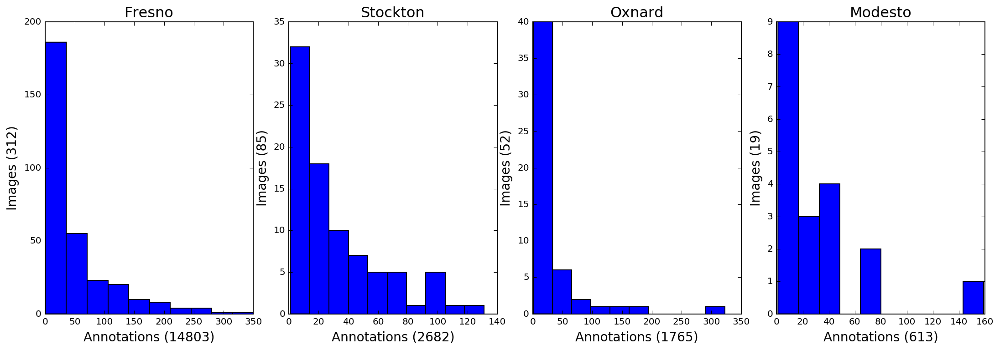

In [96]:
# Distribution of annotations per image, by city 

cities = array_agg['city'].unique()

fig, ax = plt.subplots(1, len(cities), figsize=(15,5))
fig.tight_layout()

for i, city in enumerate(cities):
    annotations = array_agg[array_agg['city'] == city]['polygon_id'].values[0]
    images = array_agg[array_agg['city'] == city]['image_name'].values[0]
    
    ax[i].hist(arrays[arrays['city'] == city]['image_name'].value_counts())
    ax[i].set_title(city, fontsize=16)
    
    ax[i].set_xlabel('Annotations (' + str(annotations) + ')', fontsize=14)
    ax[i].set_ylabel('Images (' + str(images) + ')', fontsize=14)

In [97]:
# Stockton and Oxnard Datasets are partially incomplete. Creating list of available images. 

avail_files = []

for city in cities: 

    path = '/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/Duke %s/' % (city)
    try:
        avail_files.extend(listdir(path))
    except:
        continue

avail_files = [name[:-4] for name in avail_files if name[-4:] == '.tif']

In [15]:
#  Count of array annotations and satellite images for each city in the dataset

avail_arrays = arrays_clean[arrays_clean['image_name'].isin(avail_files)]

avail_poly_agg = avail_arrays.groupby(['city','image_name'])[['polygon_id']].count().reset_index()
avail_array_agg = avail_poly_agg.groupby('city')[['image_name']].count().reset_index()
avail_array_agg = avail_array_agg.merge(misc_poly_agg.groupby('city')[['polygon_id']].sum().reset_index())
avail_array_agg = avail_array_agg.sort_values(by='image_name', ascending=False)
avail_array_agg

,city,image_name,polygon_id
2,Stockton,54,2018
1,Oxnard,39,1422
0,Modesto,19,613


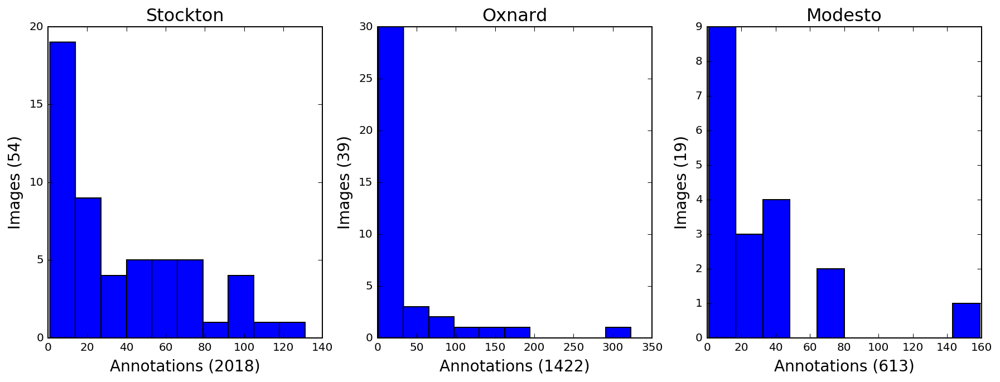

In [98]:
# Distribution of annotations per image, by city 

misc_cities = [city for city in cities if city != 'Fresno']

fig, ax = plt.subplots(1, len(misc_cities), figsize=(15,5))

for i, city in enumerate(misc_cities):
    annotations = misc_array_agg[misc_array_agg['city'] == city]['polygon_id'].values[0]
    images = misc_array_agg[misc_array_agg['city'] == city]['image_name'].values[0]
    
    ax[i].hist(misc_arrays[misc_arrays['city'] == city]['image_name'].value_counts())
    ax[i].set_title(city, fontsize=16)
    
    ax[i].set_xlabel('Annotations (' + str(annotations) + ')', fontsize=14)
    ax[i].set_ylabel('Images (' + str(images) + ')', fontsize=14)

In [100]:
# Plot centers of all solar arrays for a given satellite image

def plot_centroids(img_id):
    
    # Use img_id to create path to correct directory 
    city = arrays_clean[arrays_clean['image_name'] == img_id]['city'].values[0]
    city = 'Duke ' + city
    
    # Read in image
    img = io.imread('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/%s/%s.tif' % (city, img_id))
    
    # Extract centroid coordinates from dataframe    
    arrays_sub = arrays_clean[arrays_clean['image_name'] == img_id]
    coordinates = zip(list(arrays_sub['centroid_longitude_pixels']),
                      list(arrays_sub['centroid_latitude_pixels']))

    # Display image
    fig,ax = plt.subplots(figsize=(20, 20))

    ax.imshow(img[:,:,1], cmap=cm.gray)
    
    # Plot a circle for each solar panel array
    for x, y in coordinates:
        centroid = Circle((x, y), 20, color='blue')
        ax.add_patch(centroid)


In [106]:
# Plot polygon outline for a given solar panel array

def plot_polygon(poly_id):
     
    # Use poly_id to identify image name and create path to correct directory 
    img_id = arrays_clean[arrays_clean['polygon_id'] == poly_id]['image_name'].values[0]
    city = arrays_clean[arrays_clean['image_name'] == img_id]['city'].values[0]
    city = 'Duke ' + city
        
    # Extract polygon vertices from dataframe, calculate min/max
    vertices = arrays_clean[arrays_clean['polygon_id'] == poly_id][['polygon_vertices']].iloc[0,0]
    
    x_values = [x[0] for x in vertices]
    y_values = [y[1] for y in vertices]
    x_min, x_max = min(x_values), max(x_values) 
    y_min, y_max = min(y_values), max(y_values)

    # Read in image, crop   
    img = io.imread('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/%s/%s.tif' % (city, img_id))
    band = 20
    img_cropped = img[x_min - band : x_max + band, 
                      y_min - band : y_max + band]

    # Display cropped image
    fig,ax = plt.subplots()

    ax.imshow(img_cropped)

    # Plot a polygon for each solar panel array. Vertices must be flipped to conform to 'Polygon' convention
    resized_coords = [(y - (y_min - band) - 1, x - (x_min - band) - 1) for x, y in vertices]
    poly = Polygon(resized_coords, fill=False, color='blue')
    ax.add_patch(poly)
    

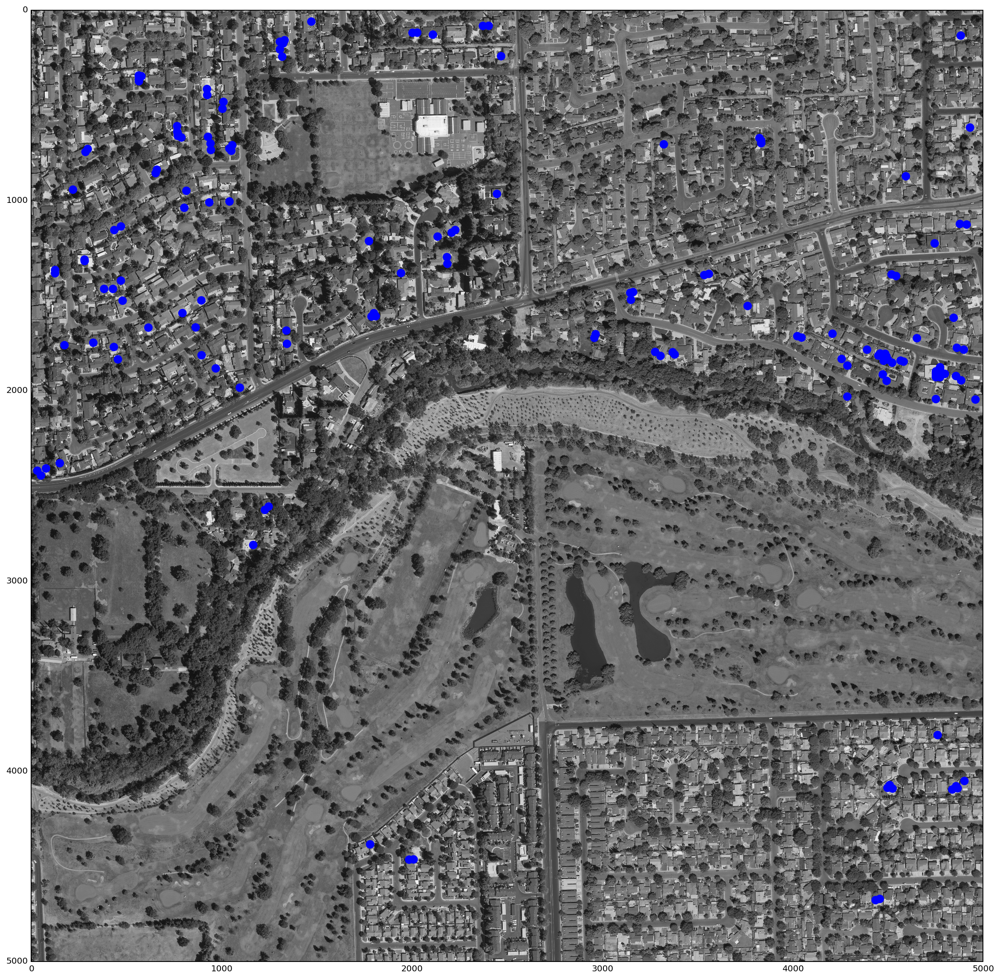

In [107]:
plot_centroids('10sfg810685')

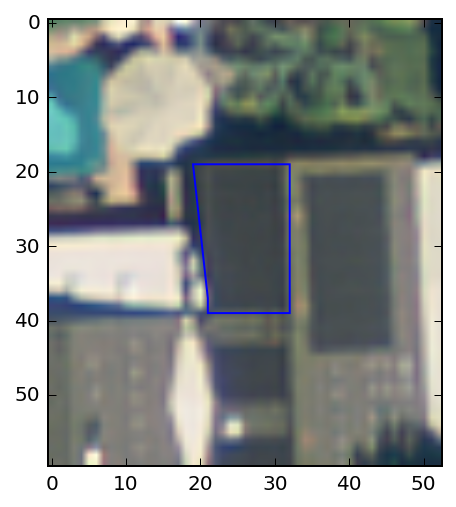

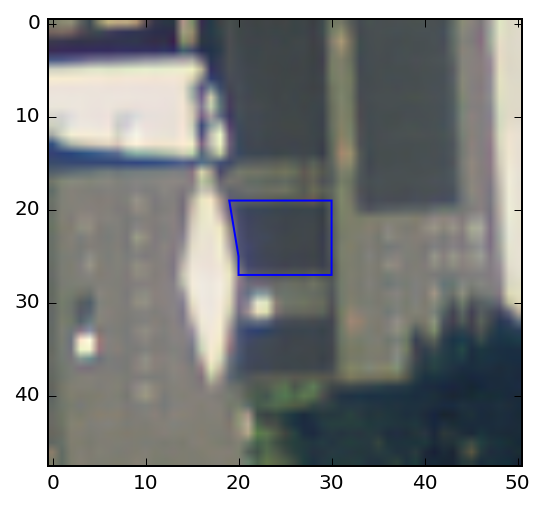

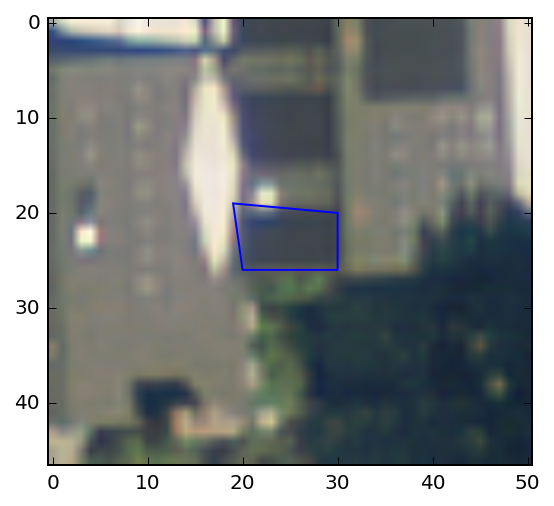

In [108]:
poly_list = arrays_clean[arrays_clean['image_name'] == '10sfg810685']['polygon_id'].values

for poly in poly_list[:3]:
    plot_polygon(poly)

<a href='#Top'>Back to Top</a>
<a id='Section 3'></a>

# Section 3. Image Segmentation
Image segmentation consists of breaking down an image into sub-regions, or superpixels. Segmentation is commonly performed in object detection tasks and image analysis more broadly. In addition to producing a more meaningful representation of the image, segmentation can also improve classification accuracy and reduce computational complexity. 

Here I utilize the Quickshift algorithm to segment the image, which is a clustering algorithm that is closely related to Mean Shift. Quickshift evaluates local neighborhoods of pixels and groups them into like regions that are defined by their color values and x, y position within the image. 

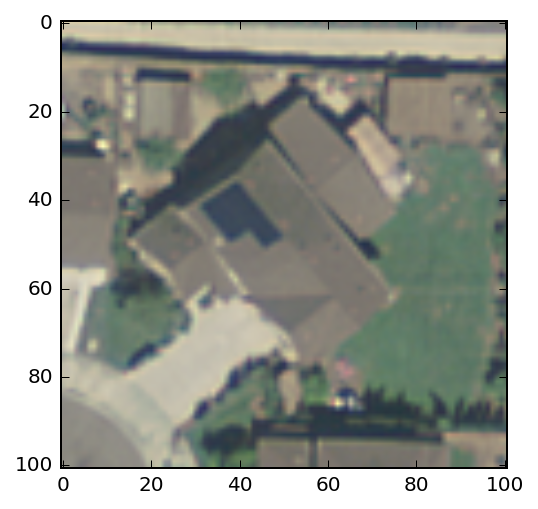

In [191]:
sample_img = io.imread('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/Duke KaggleInClass/train_images/image60.tif')
plt.imshow(sample_img)
plt.show()

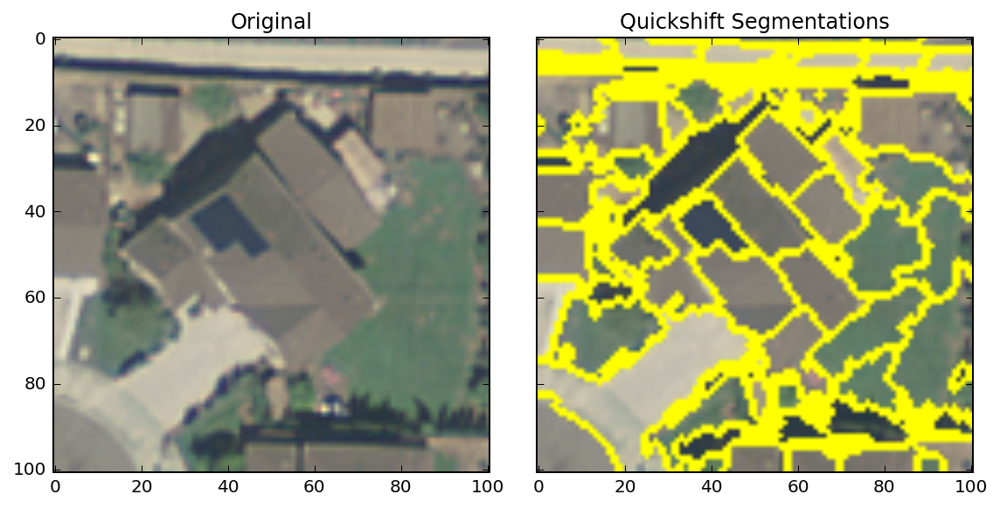

In [193]:
# Use ipywidgets to experiment with algorithm parameters

def plot_segments(img, kernel_size=2, max_dist=10, ratio=0.5):
    
    fig, axes = plt.subplots(1, 2, figsize=(8,4), sharex=True, sharey=True)
    fig.tight_layout()
    
    axes[0].imshow(img)
    axes[0].set_title("Original")

    axes[1].imshow(mark_boundaries(img, quickshift(img, kernel_size=kernel_size, max_dist=max_dist, ratio=ratio)))
    axes[1].set_title("Quickshift Segmentations")

    plt.show()
    
interact(plot_segments, img=fixed(sample_img), kernel_size=(1,10,1), max_dist=(0,20,1), ratio=(0,1,0.1))

<a href='#Top'>Back to Top</a>
<a id='Section 4'></a>

# Section 4: Segment Feature Extraction
Feature extraction is a key component of image analysis and object detection. I aim to classify segments or superpixels and will therefore calculate features based on these regions of pixels, rather than the pixels themselves. Once a feature set is established, I will then be able to train a classifier to identify regions that are best representative of solar panels. 

In this analysis, features will mostly consist of summary statistics for each color channel (e.g. mean, min, max, variance) but will also include other descriptive values such as area and perimeter.    

### Part 1, Spatial Features

In [112]:
# Extract spatial features

def segment_features_shape(segments, img_id='na', quickshift=False):

    # Skimage segmentation algorithms assign a "0" label, however, measure.regionprops only reads labels > 0 
    # If quickshift == True, add 1 to all segment labels
    if quickshift:
        segments = segments + 1
        
    # Convert labels to int and generate unique labels list
    segments = segments.astype(int)
    segment_labels = np.unique(segments[segments > 0])

    # For each region/segment, create regionprops object and extract features
    region_props_all = measure.regionprops(segments)    
    region_features = {}
        
    for i, region in enumerate(region_props_all):    

        shape_features = {}

        shape_features['image_id'] = img_id
        shape_features['segment_id'] = segment_labels[i]
        shape_features['perimeter'] = region.perimeter
        shape_features['area'] = region.area
        shape_features['circleness'] = (4 * np.pi * region.area) / (max(region.perimeter, 1) ** 2)
        shape_features['centroid'] = region.centroid
        shape_features['coords'] = region.coords

        region_features[segment_labels[i]] = shape_features
    
    index = ['image_id', 'segment_id', 'perimeter', 'area', 'circleness', 'centroid', 'coords']
    
    shape_df = pd.DataFrame(region_features, index=index).T
    
    return shape_df


### Part 2, Color Features

In [113]:
# Extract color features

def segment_features_color(img, segments, img_id='na', quickshift=False):
    
    # Skimage segmentation algorithms assign a "0" label, however, measure.regionprops only reads labels > 0 
    # If quickshift == True, add 1 to all segment labels
    if quickshift:
        segments = segments + 1
        
    # Convert labels to int and generate unique labels list
    segments = segments.astype(int)
    segment_labels = np.unique(segments[segments > 0])

    # For each segment and channel, calculate summary stats    
    channels = ['r','g','b']    
    region_features = {}
    
    for label in segment_labels:
        region = img[segments == label]
        
        color_features = {}        
               
        for i, channel in enumerate(channels):
            values = describe(region[:,i])
            
            color_features['image_id'] = img_id
            color_features['segment_id'] = label
            color_features[channel + '_min'] = values.minmax[0]
            color_features[channel + '_max'] = values.minmax[1]
            color_features[channel + '_mean'] = values.mean
            color_features[channel + '_variance'] = values.variance
            color_features[channel + '_skewness'] = values.skewness
            color_features[channel + '_kurtosis'] = values.kurtosis
            
        region_features[label] = color_features
        
    index = ['image_id','segment_id','r_min','r_max','r_mean','r_variance','r_skewness',
         'r_kurtosis','g_min','g_max','g_mean','g_variance','g_skewness','g_kurtosis',
         'b_min','b_max','b_mean','b_variance','b_skewness','b_kurtosis']
        
    color_df = pd.DataFrame(region_features, index=index).T
        
    return color_df


<a href='#Top'>Back to Top</a> 
<a id='Section 5'></a>

# Section 5: Building a Dataset
With the feature extraction functions in place, the next step in the processing pipeline is to define the regions containing solar panels and the regions without any solar panels. Once this mask is defined, features can be calculated, assigned a class, and agreggated together in order to train a classifier. 

In [115]:
# Create a mask for all solar panels in the image, with each labeled by its polygon_id

def panel_mask(img_id, use_labels=False):
  
    # Identify city in order to navigate to correct directory 
    city = arrays_clean[arrays_clean['image_name'] == img_id]['city'].values[0]
    city = 'Duke ' + city
    
    # Read in image
    img = io.imread('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/%s/%s.tif' % (city, img_id))
    
    # Select polygon vertices for all polygons in image
    vertices = arrays_clean[arrays_clean['image_name'] == img_id]['polygon_vertices'].values
    labels = arrays_clean[arrays_clean['image_name'] == img_id]['polygon_id'].values
    
    # Create scaffolding for mask
    mask = np.zeros((img.shape[0],img.shape[1]))
    mask[mask == 0] = np.nan
        
    # Option to use custom labels for each panel array
    if use_labels == False:
        poly_data = enumerate(vertices, 1)
    else:
        poly_data = zip(labels, vertices)
        
    # Iterate through vertices and assign labels to pixels
    for i, poly in poly_data:
        x = np.array([vert[0] for vert in poly])
        y = np.array([vert[1] for vert in poly])
        
        mask[polygon(x, y, shape=(img.shape[0],img.shape[1]))] = i 
        mask[polygon_perimeter(x, y,shape=(img.shape[0],img.shape[1]))] = i

    return mask


In [116]:
# Create a series of random windows that do not overlap with any solar panels

def no_panel_mask(panel_mask, window_size=100, windows=20):
    
    # Create scaffolding for mask 
    panels = panel_mask.copy() 
    
    mask = np.zeros(panels.shape)
    mask[mask == 0] = np.nan
        
    rows = panels.shape[0]
    cols = panels.shape[1]
        
    # Create i number of random windows with no panels
    for i in range(windows): 
    
        search = True
        
        # Iterate until random window found
        while search:

            random_x = np.random.randint(0, rows - window_size + 1)
            random_y = np.random.randint(0, cols - window_size + 1)
            random_window = panels[random_x: random_x + window_size, random_y: random_y + window_size]

            # End search when random window is all nan, i.e. does not overlap with any panels
            if np.isnan(random_window).sum() == random_window.size:
                
                # Update mask to include new random window
                mask[random_x: random_x + window_size, random_y: random_y + window_size] = i + 1
                
                # Update panel_mask copy to avoid duplicate random window on next iteration
                panels[random_x: random_x + window_size, random_y: random_y + window_size] = 0
                
                # Go to next window 
                search = False
                
    return mask


In [117]:
# Return masks

def return_masks(img_id):
    
    # Create panel mask 
    panels = panel_mask(img_id, use_labels=True)
    
    # Create no panel mask 
    no_panels = no_panel_mask(panels, window_size=60, windows=25)
    
    return panels, no_panels


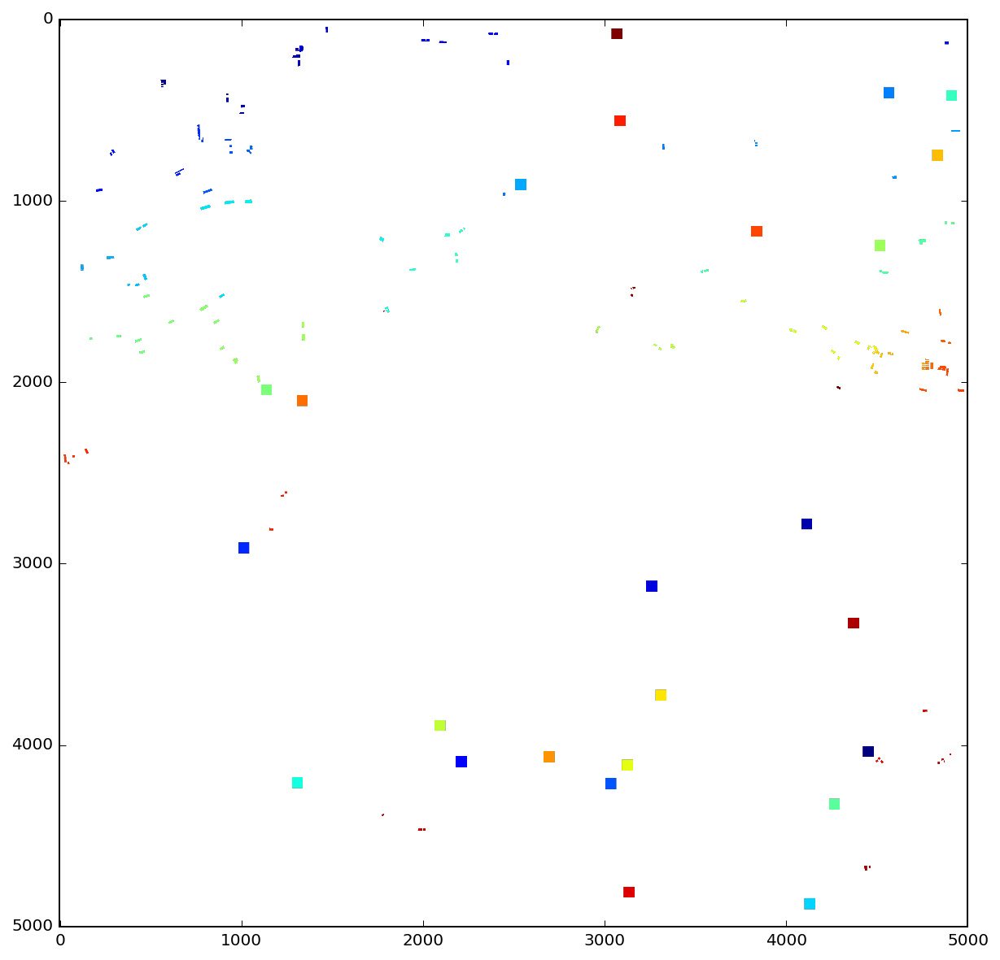

In [118]:
# Create masks for an example image and plot

fig, ax = plt.subplots(figsize=(10,10))

masks = return_masks('10sfg810685')

ax.imshow(masks[0])
ax.imshow(masks[1])
    
plt.show()

In [124]:
# Return features for all solar panels

def extract_pos_features(img_id, quickshift=False):
    
    # Identify city in order to navigate to correct directory 
    city = arrays_clean[arrays_clean['image_name'] == img_id]['city'].values[0]
    city = 'Duke ' + city
    
    # Read in image
    img = io.imread('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/%s/%s.tif' % (city, img_id))
    
    # Create panel mask 
    segments_panels = panel_mask(img_id, use_labels=True)
    
    # Extract shape features
    shape_df = segment_features_shape(segments_panels, img_id, quickshift=quickshift)
        
    # Extract color features
    color_df = segment_features_color(img, segments_panels, img_id, quickshift=quickshift)

    # Combine features into single dataframe
    features_df = shape_df.merge(color_df, how='inner', on=['image_id','segment_id'])
    
    return features_df


In [125]:
# Return features for regions without solar panels

def extract_neg_features(img_id, window_size=100, windows=20):
    
    # Identify city in order to navigate to correct directory 
    city = arrays_clean[arrays_clean['image_name'] == img_id]['city'].values[0]
    city = 'Duke ' + city
    
    # Read in image
    img = io.imread('/Users/alexanderhalcomb/Desktop/SolarPV/Datasets/%s/%s.tif' % (city, img_id))
                       
    # Create panel mask 
    segments_panels = panel_mask(img_id, use_labels=True)

    # Create no panel mask 
    windows_no_panels = no_panel_mask(segments_panels, window_size=window_size, windows=windows)
    windows_labels = np.unique(windows_no_panels[windows_no_panels > 0])

    frames = []
    
    for label in windows_labels:

        # Extract window from image
        window_img = img[windows_no_panels == label].reshape((window_size, window_size, 3))
        
        # Divide window into segments using Quickshift segmentation algorithm 
        segments_quick = quickshift(window_img, kernel_size=3, max_dist=8, ratio=0.65)
        segments_labels = np.unique(segments_quick)

        # Extract shape features
        shape_df = segment_features_shape(segments_quick, img_id, quickshift=True) 

        # Extract color features
        color_df = segment_features_color(window_img, segments_quick, img_id, quickshift=True)

        # Combine features into single dataframe
        features_df = shape_df.merge(color_df, how='inner', on=['image_id','segment_id'])
        
        # Append to list to facilitate aggregation
        frames.append(features_df)
        
    return pd.concat(frames)


In [128]:
# Input image(s) and feed through entire pipeline, return df of results

def process_images(images):
    
    frames = []
    
    for img_id in images:
        
        pos_features = extract_pos_features(img_id)
        pos_features['panel_class'] = 1

        neg_features = extract_neg_features(img_id, window_size=60, windows=25)
        neg_features['panel_class'] = 0

        combined_features = pd.concat([pos_features, neg_features])
        combined_features.dropna(inplace=True)
        
        frames.append(combined_features)
    
    return pd.concat(frames).reset_index(drop=True)

<a href='#Top'>Back to Top</a> 
<a id='Section 6'></a>

# Section 6: Classification 
In this section, a Logistic Regression and Random Forest Classifier will be trained and evaluated on the test data.

In [165]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier

from sklearn.cross_validation import cross_val_score, StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.grid_search import GridSearchCV

from sklearn.metrics import confusion_matrix, precision_recall_curve, classification_report
from sklearn.metrics import roc_curve, auc

In [162]:
combined_features = pd.read_pickle('/Users/alexanderhalcomb/Desktop/DSI-SF-2-alexhalcomb/Capstone/combined_features3.p')
combined_features.shape

(46707, 26)

In [166]:
# Create X and y data

excluded = ['panel_class', 'image_id', 'segment_id', 'centroid', 'coords', 'r_skewness', 
            'g_skewness', 'b_skewness','r_kurtosis', 'g_kurtosis', 'b_kurtosis']

X_cols = [col for col in combined_features.columns if col not in excluded]

ss = StandardScaler()

X = combined_features[X_cols]
Xn = ss.fit_transform(X)

y = combined_features['panel_class']
y_base = max(np.mean(y), 1 - np.mean(y))

# Split data into a training and testing set

X_train, X_test, y_train, y_test = train_test_split(Xn, y, test_size=0.3, stratify=y)

print X_train.shape, X_test.shape
print y_train.shape, y_test.shape

(32694, 15) (14013, 15)
(32694,) (14013,)


### Logistic Regression

Many of the features in this dataset are identical (e.g. min, max, mean) but for the color channel. As a result, there is inherent colinearity between many of the predictors. This can be problematic in linear/logistic regression, so I am including a regularization penalty to "denoise" the coefficients attributable to each feature. 

In [168]:
# GridSearch a LogisticRegression classifier

lr = LogisticRegression()

lr_params = {
    'penalty':['l1','l2'],
    'solver':['liblinear'],
    'C':np.linspace(0.0001, 500, 50)
}

lr_gs = GridSearchCV(lr, lr_params, cv=5, verbose=1)
lr_gs.fit(X_train, y_train)
print 'Done fitting.'

Fitting 5 folds for each of 100 candidates, totalling 500 fits


[Parallel(n_jobs=1)]: Done  49 tasks       | elapsed:   38.5s
[Parallel(n_jobs=1)]: Done 199 tasks       | elapsed:  3.1min
[Parallel(n_jobs=1)]: Done 449 tasks       | elapsed:  7.3min
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:  8.1min finished


Done fitting.


In [169]:
# Check results of Logistic Regression GridSearch

lr_best = lr_gs.best_estimator_
print 'Logistic Regression GridsearchCV Results:'
print 'Best Estimator', lr_best
print 'Best Parameters',  lr_gs.best_params_
print 'Best Score', '%0.4f' % lr_gs.best_score_, '\n'

# Check results against hold out test set 

print 'Cross Validation on Test Set:'
print 'Score: ', '%0.4f' % lr_gs.score(X_test, y_test)
print 'Baseline Accuracy: ', '%0.4f' % y_base
print 'Percent Better: ', '%0.4f' % ((lr_gs.score(X_test, y_test) - y_base) / (1 - y_base))

Logistic Regression GridsearchCV Results:
Best Estimator LogisticRegression(C=10.204179591836734, class_weight=None, dual=False,
          fit_intercept=True, intercept_scaling=1, max_iter=100,
          multi_class='ovr', n_jobs=1, penalty='l2', random_state=None,
          solver='liblinear', tol=0.0001, verbose=0, warm_start=False)
Best Parameters {'penalty': 'l2', 'C': 10.204179591836734, 'solver': 'liblinear'}
Best Score 0.9674 

Cross Validation on Test Set:
Score:  0.9657
Baseline Accuracy:  0.9132
Percent Better:  0.6044


### Random Forest

Decision tree models are comprised of a series of nodes, or decisions, where an element of the data is tested e.g. is element x > 5. These tests are derived by evaluating how effective they are at dividing the data into homogonous groups. Once this series of tests have been established, they can be used for classification or regression. 

A Random Forest is simply a collection of decision tree models, with each decision tree fit on a random sample of the data. By using many decision trees on multiple versions of the dataset, overfitting can be avoided. This reduces model variance significantly with only a small increase in bias. 

Random Forests are especially good at interpreting high dimensional data and non-linear relationships, which makes it quite suitable for image analysis and object classification tasks. 

In [170]:
# GridSearch a RF classifier

rf = RandomForestClassifier()

rf_params = {
    'max_features':[None,'log2','sqrt', 2,3,4,5],
    'max_depth':[1,2,3,None],
    'min_samples_leaf':np.linspace(1,101,20),
    'n_estimators':[50]
}

rf_gs = GridSearchCV(rf, rf_params, cv=5, verbose=1, n_jobs=-1)
rf_gs.fit(X_train, y_train)
print 'Done fitting.'

Fitting 5 folds for each of 560 candidates, totalling 2800 fits


[Parallel(n_jobs=-1)]: Done  42 tasks      | elapsed:   40.3s
[Parallel(n_jobs=-1)]: Done 192 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:  3.1min
[Parallel(n_jobs=-1)]: Done 792 tasks      | elapsed:  7.1min
[Parallel(n_jobs=-1)]: Done 1242 tasks      | elapsed: 10.7min
[Parallel(n_jobs=-1)]: Done 1792 tasks      | elapsed: 18.4min
[Parallel(n_jobs=-1)]: Done 2442 tasks      | elapsed: 37.9min
[Parallel(n_jobs=-1)]: Done 2800 out of 2800 | elapsed: 48.8min finished


Done fitting.


In [171]:
# Check results of Random Forest GridSearch

rf_best = rf_gs.best_estimator_
print 'Random Forest GridsearchCV Results:'
print 'Best Estimator', rf_best
print 'Best Parameters',  rf_gs.best_params_
print 'Best Score', '%0.4f' % rf_gs.best_score_, '\n'

# Check results against hold out test set 

print 'Cross Validation on Test Set:'
print 'Score: ', '%0.4f' % rf_gs.score(X_test, y_test)
print 'Baseline Accuracy: ', '%0.4f' % y_base
print 'Percent Better: ', '%0.4f' % ((rf_gs.score(X_test, y_test) - y_base) / (1 - y_base))

Random Forest GridsearchCV Results:
Best Estimator RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features=5, max_leaf_nodes=None,
            min_samples_leaf=1.0, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=50, n_jobs=1,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)
Best Parameters {'max_features': 5, 'n_estimators': 50, 'max_depth': None, 'min_samples_leaf': 1.0}
Best Score 0.9792 

Cross Validation on Test Set:
Score:  0.9805
Baseline Accuracy:  0.9132
Percent Better:  0.7755


In [172]:
# Create variables for class predictions and probability predictions

y_pred_lr = lr_gs.predict(X_test)
y_prob_lr = lr_gs.predict_proba(X_test)[:,1]

y_pred_rf = rf_gs.predict(X_test)
y_prob_rf = rf_gs.predict_proba(X_test)[:,1]

In [173]:
# Function to plot precision recall curve

def plot_precision_recall(y_true, y_prob, title='Precision Recall Curve'):
    
    precision, recall, thresholds = precision_recall_curve(y_true, y_prob)

    fig, ax = plt.subplots(figsize=(7,5))

    plt.plot(recall, precision, 'b')
    plt.plot([1,0], [0,1], '--r')
    
    plt.title(title, fontsize=16)   
    plt.xlabel('Recall', fontsize=14)
    plt.ylabel('Precision', fontsize=14)

    plt.show()


In [174]:
# Function to plot ROC curve

def plot_roc(y_true, y_prob, title='Receiver Operating Characteristic'):
    
    false_positive_rate, true_positive_rate, thresholds = roc_curve(y_true, y_prob)
    roc_auc = auc(false_positive_rate, true_positive_rate)

    fig, ax = plt.subplots(figsize=(7,5))

    plt.plot(false_positive_rate, true_positive_rate, 'b', label='AUC = %0.3f'% roc_auc)
    plt.plot([0,1],[0,1],'r--')
    
    plt.title(title, fontsize=16)
    plt.xlabel('False Positive Rate (Fall-out)', fontsize=14)
    plt.ylabel('True Positive Rate (Recall)', fontsize=14)
    plt.legend(loc='lower right')

    plt.show()


In [175]:
# Function to plot confusion matrix, normalized=True returns cm in the form of percentages

def plot_confusion_matrix(y_true, y_pred, cmap=plt.cm.Greens, normalize=False, title='Confusion Matrix'):
    
    matrix = confusion_matrix(y_true, y_pred, labels=[1,0])

    fig, axes = plt.subplots(figsize=(5,5))
    fig.tight_layout()
    
    if normalize:
        matrix = matrix.astype('float') / matrix.sum(axis=1)[:, np.newaxis]
        plt.title(title, fontsize=16)
    else:
        matrix = matrix
        plt.title(title, fontsize=16)
        
    classes = ['Solar Panels','None']
    ticks = np.arange(len(classes))

    plt.imshow(matrix, interpolation='nearest', cmap=cmap)

    thresh = matrix.max() / 2.
    
    for row in range(matrix.shape[0]):
        for col in range(matrix.shape[1]):
            plt.text(col, row, np.around(matrix[row, col], decimals=3), horizontalalignment='center', 
                     color='white' if matrix[row, col] > thresh else 'black', fontsize=14)
    
    plt.xticks(ticks, classes, rotation=45)
    plt.yticks(ticks, classes, rotation=45)
    
    plt.ylabel('True label', fontsize=14)
    plt.xlabel('Predicted label', fontsize=14)
    
    plt.colorbar()
    plt.show()


In [176]:
# Extract Logistic Regression coefs

coefs = pd.DataFrame({'feature': X.columns,
                      'abs_coef': [abs(coef) for coef in lr_best.coef_[0]],
                      'coef': lr_best.coef_[0]}, columns=['feature','abs_coef','coef'])
coefs.sort_values('abs_coef', ascending=False, inplace=True)

coefs

,feature,abs_coef,coef
13,b_mean,6.574313,6.574313
5,r_mean,5.844985,-5.844985
1,area,4.601501,4.601501
2,circleness,4.188803,-4.188803
9,g_mean,2.941852,-2.941852
4,r_max,2.782784,2.782784
3,r_min,2.692627,2.692627
11,b_min,2.295006,-2.295006
12,b_max,2.230534,-2.230534
0,perimeter,2.068020,-2.068020


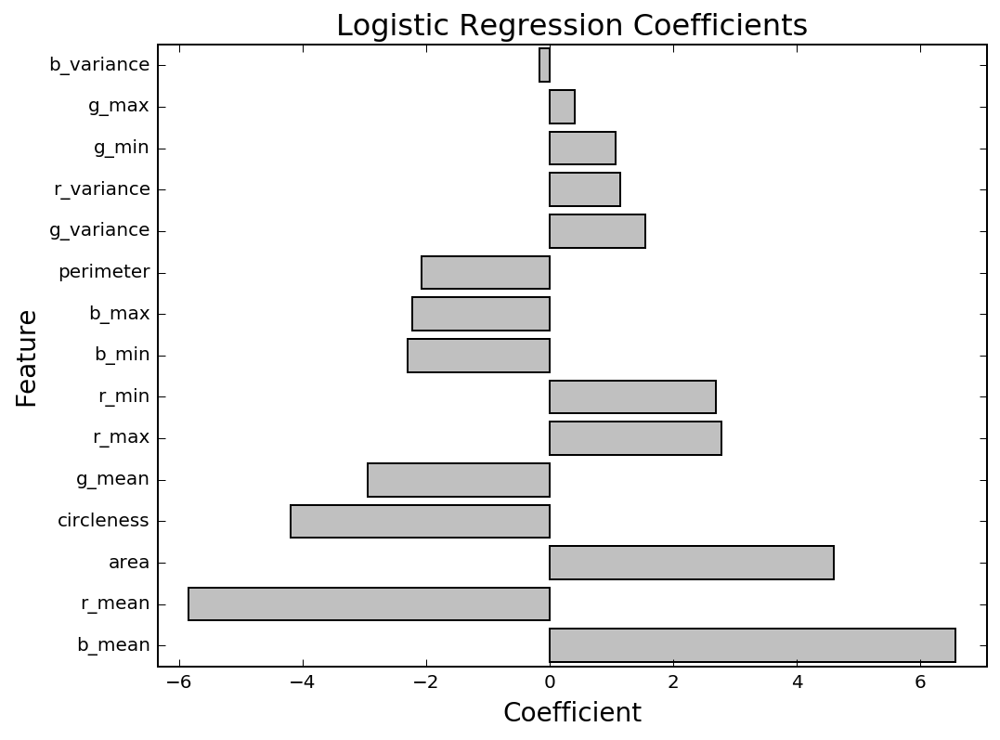

In [237]:
# Plot Logistic Regression coefs 

fig, ax = plt.subplots(figsize=(8, 6))

ax.barh(np.arange(len(coefs['abs_coef'].values)), coefs['coef'], 0.8, align='center', color='silver')

ax.set_yticks(np.arange(len(coefs['abs_coef'].values)))
ax.set_yticklabels(coefs['feature'], fontsize=10)
ax.set_ylabel('Feature', fontsize=14)
ax.set_xlabel('Coefficient', fontsize=14)
ax.set_ylim([-0.5, 14.5])
ax.set_xlim([coefs['coef'].min()-0.5, coefs['coef'].max()+0.5])
ax.set_title('Logistic Regression Coefficients', fontsize=16)
plt.show()

In [177]:
# Extract RF feature importance

feature_importance = pd.DataFrame({'feature': X.columns,
                                   'importance': rf_best.feature_importances_})

feature_importance.sort_values('importance', ascending=False, inplace=True)

feature_importance

,feature,importance
6,r_variance,0.313193
10,g_variance,0.180416
14,b_variance,0.096111
2,circleness,0.078631
1,area,0.073117
0,perimeter,0.038403
5,r_mean,0.036959
9,g_mean,0.027924
13,b_mean,0.026981
3,r_min,0.025501


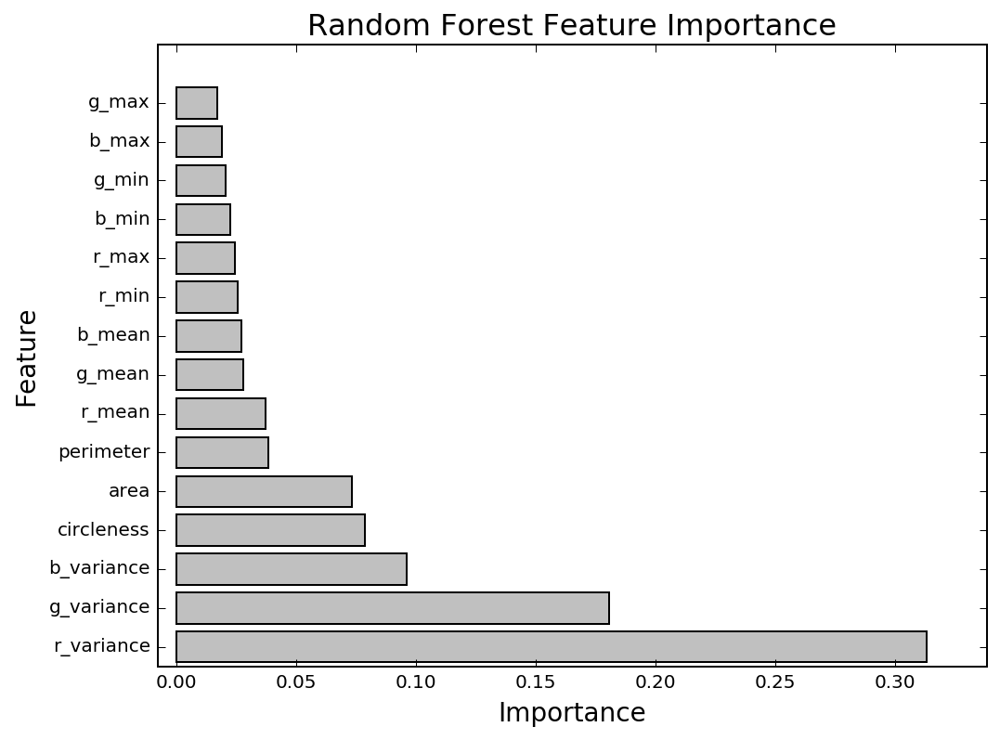

In [238]:
# Plot RF feature importance

fig, ax = plt.subplots(figsize=(8, 6))

ax.barh(np.arange(len(feature_importance['importance'].values)), feature_importance['importance'], 0.8, align='center', color='silver')

ax.set_yticks(np.arange(len(feature_importance['importance'].values)))
ax.set_yticklabels(feature_importance['feature'], fontsize=10)
ax.set_ylabel('Feature', fontsize=14)
ax.set_xlabel('Importance', fontsize=14)
ax.set_ylim([-0.5, 15.5])
ax.set_xlim([feature_importance['importance'].min()-0.025, feature_importance['importance'].max()+0.025])
ax.set_title('Random Forest Feature Importance', fontsize=16)
plt.show()

The Receiver Operating Characteristic curve measures the True Positive Rate or Recall (TP / TP + FN) against the False Positive Rate (FP / FP + TN). There is a tradeoff between and the two and plotting the ROC is a helpful way to analyze the effectiveness of a classifier. 

In this analysis, the True Positive Rate measures how many solar panels are being correctly classified, out of the total number of solar panels in the image. As this ratio increases, however, the number of non panel regions that are being misclassified as solar panels also increases. The AUC, or Area Under the Curve, is a common way to quantify this tradeoff. An AUC of 1 reflects perfect classification.

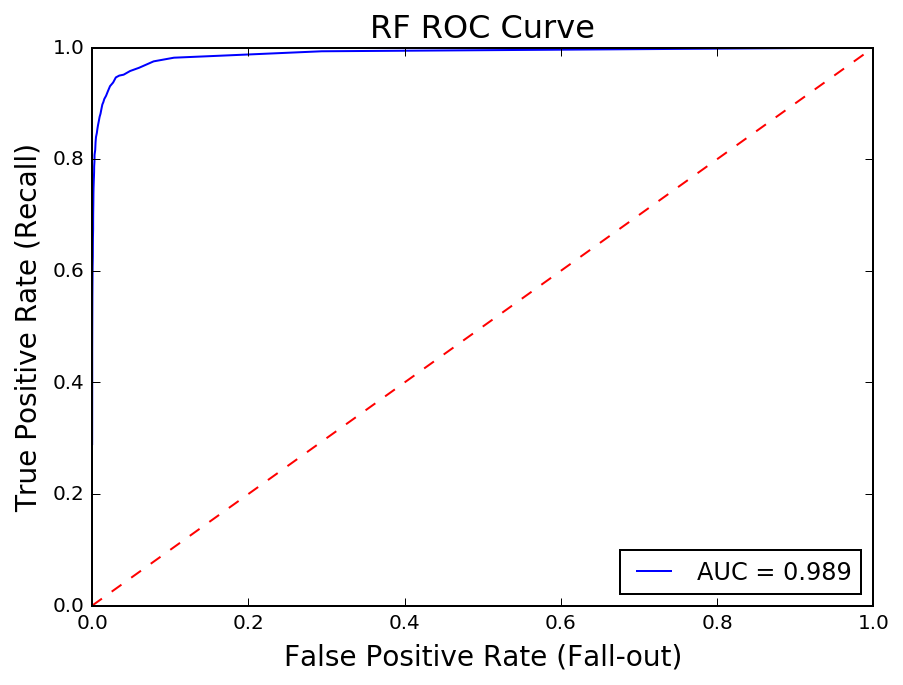

In [178]:
plot_roc(y_test, y_prob_rf, title= 'RF ROC Curve')

The Precision Recall curve is closely related to the ROC curve in that both reflect tradeoffs. Instead of the False Positive Rate, however, Recall is compared to Precision which measures the number of true positives out of total positive predictions (TP / TP + FP). 

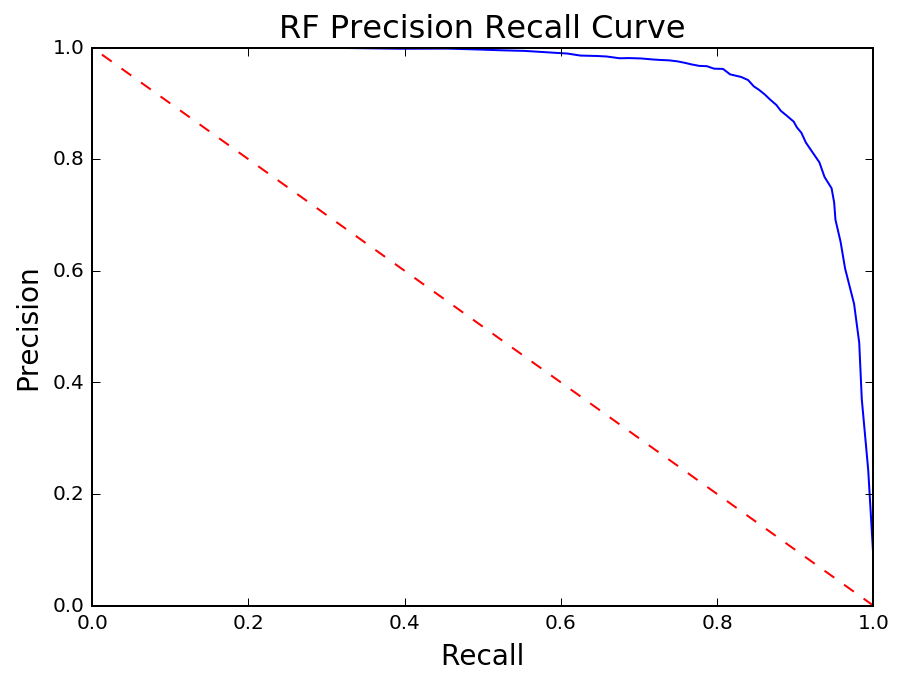

In [179]:
plot_precision_recall(y_test, y_prob_rf, title='RF Precision Recall Curve')

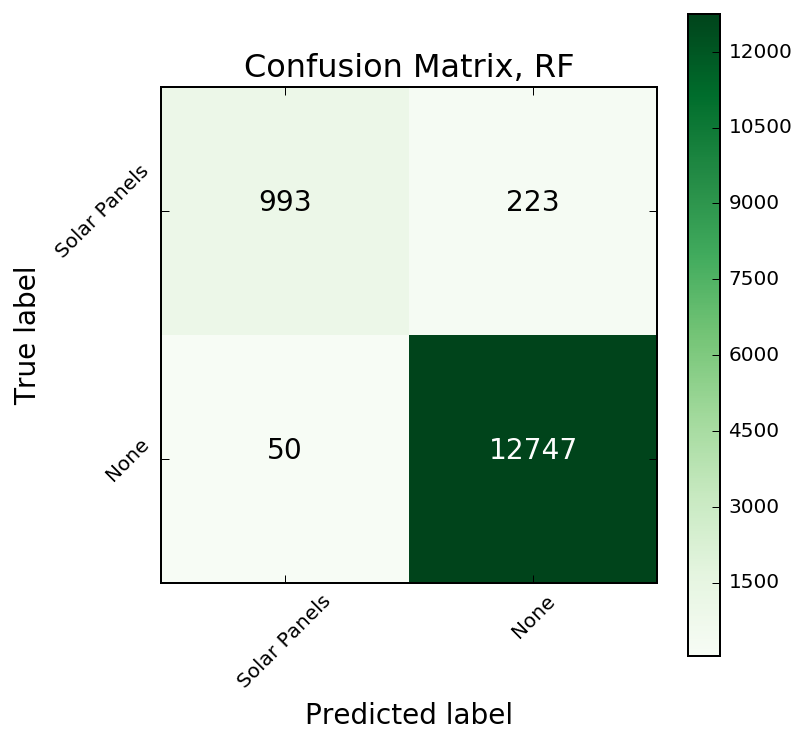

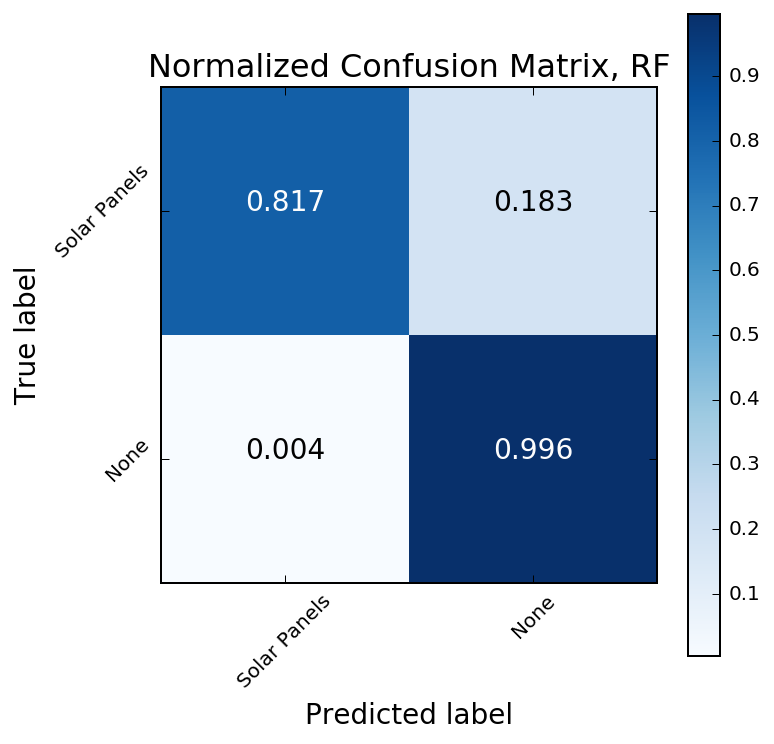

In [180]:
plot_confusion_matrix(y_test, y_pred_rf, title='Confusion Matrix, RF')
plot_confusion_matrix(y_test, y_pred_rf, normalize=True, cmap=plt.cm.Blues, title='Normalized Confusion Matrix, RF')

### Misclassified

Around 20% of the solar panels are being misclassified as 'not a solar panel' using the current model. I will examine the false negatives with the lowest predicted probabilities in order to better understand where the model is failing the worst. 

In [182]:
# Use classifier outputs to return dataframe with false positives, false negatives, and associated probabilities

def misclassified(y_true, y_prob, y_pred, error='all'):

    y_prob_series = pd.Series(y_prob, index=y_true.index)
    
    misclassified = pd.DataFrame({'y_true': y_true, 
                                  'y_pred': y_pred,
                                  'y_prob': y_prob_series}, 
                                 columns=['y_true', 'y_pred', 'y_prob'])

    misclassified = misclassified[misclassified['y_true'] != misclassified['y_pred']]
    misclassified['kind'] = misclassified['y_true'].map(lambda x: 'fp' if x == 0 else 'fn')
    misclassified.reset_index(inplace=True)
        
    fn = misclassified[misclassified['kind'] == 'fn'].sort_values(by='y_prob')
    fp = misclassified[misclassified['kind'] == 'fp'].sort_values(by='y_prob', ascending=False)
    
    if error == 'all':
        return misclassified
    elif error == 'fn':
        return fn
    else:
        return fp


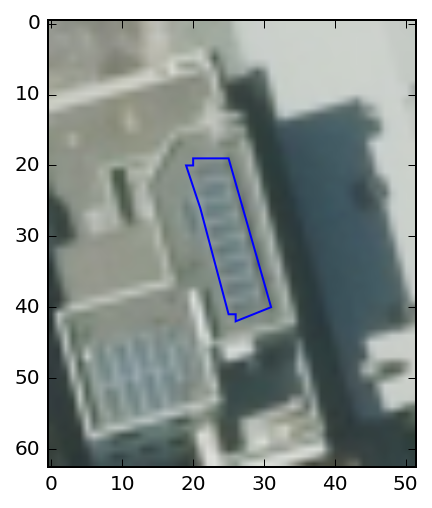

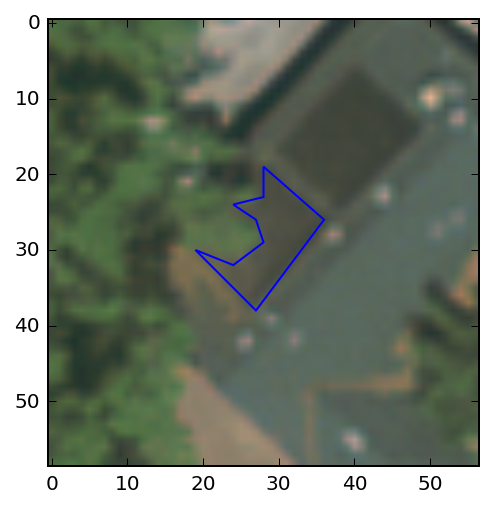

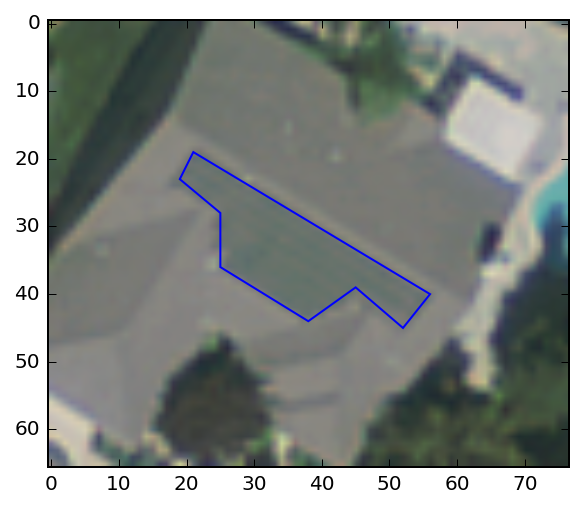

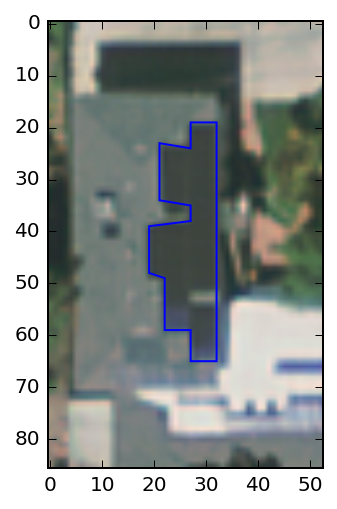

In [186]:
# Plot false negatives with lowest 'panel' probability

fn_ids = misclassified(y_test, y_prob_rf, y_pred_rf, error='fn')['index'].values[:4]
fn_poly_ids = combined_features[combined_features.index.isin(fn_ids)]['segment_id'].values
fn_poly_images = combined_features[combined_features.index.isin(fn_ids)]['image_id'].values

for img, poly in zip(fn_poly_images, fn_poly_ids):
    plot_polygon(poly)

<a href='#Top'>Back to Top</a> 
<a id='Section 7'></a>

# Section 7: Conclusion and Next Steps

There are a number of areas for further improvement. Specifically, it's clear that there two types of solar panels that have proven difficult to detect. Panels that appear very light in color, and those that show significant grid lines. In the first instance, the panels tend to blend in with the roof of the building and are therefore difficult to distinguish. In the second case, the color values and variance are skewed relative to the rest of the dataset.

The end goal for this project is to classify solar panels in images that have not been annotated. I have begun the process of generalizing this framework to images 'in the wild'. Steps will include reading a new image in, segmenting into regions, classifying all regions, and comparing positive classifications against ground truth data. 

The key challenges will be as follows:
- Good segmentation: Ensuring that the entirety of a solar panel is included in its own region. Will require fine tuning of segmentation algorithm parameters and potentially pre-segmentation processing (filters, denoising, etc.)
- Model --> Real World: Bridging the gap between the data that the classifier trained on and what will be outputted from a new image. Specifically, solar panel annotations in the training set do not necessarily match up with what a segmentation algorithm will extract. 